# Estimate galaxy size in images

This notebook develops an algorithm to estimate galaxy size in images

In [2]:
"""
Modified from source: https://github.com/tensorflow/addons/issues/358"""

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf


@tf.function
def otsu(images):
    """
    otsu's method of thresholding

    Take grayscale images and return boolean masks
    """

    ###### guassian blurring first ######
    sigma = 10
    dtype = tf.float32
    batch_size, h, w, n_channels = images.shape
    kernel_size = sigma * 4
    x = tf.range(-kernel_size // 2 + 1, kernel_size // 2 + 1, dtype=dtype)
    g = tf.math.exp(-(tf.pow(x, 2) / (2 * tf.pow(tf.cast(sigma, dtype), 2))))
    g_norm2d = tf.pow(tf.reduce_sum(g), 2)
    g_kernel = tf.tensordot(g, g, axes=0) / g_norm2d
    g_kernel = tf.expand_dims(g_kernel, axis=-1)
    g_kernel = tf.expand_dims(tf.tile(g_kernel, (1, 1, n_channels)), axis=-1)
    g_kernel = tf.cast(g_kernel, tf.dtypes.float32)
    img = tf.image.convert_image_dtype(images, tf.dtypes.float32)
    # valid padding as we dont really care about edges anyway
    images = tf.nn.conv2d(img, g_kernel, [1, 1, 1, 1], padding="VALID")[:, :, :, 0]
    ###### guassian blurring ends ######

    images = tf.cast(images, tf.int32)
    batch_size, h, w = images.shape
    hist = tf.map_fn(
        lambda x: tf.math.bincount(x, dtype=tf.int32, minlength=256, maxlength=256),
        images,
    )

    current_max = tf.zeros(batch_size, dtype=tf.float32)
    threshold = tf.zeros(batch_size, dtype=tf.int32)

    total = h * w

    spre = tf.TensorArray(dtype=tf.int32, size=256, clear_after_read=False)
    sw = tf.TensorArray(dtype=tf.int32, size=256, clear_after_read=False)
    spre = spre.write(0, hist[:, 0])
    sw = sw.write(0, tf.zeros(batch_size, dtype=tf.int32))

    for i in tf.range(1, 256):
        spre = spre.write(i, spre.read(i - 1) + hist[:, i])
        sw = sw.write(i, sw.read(i - 1) + (i * hist[:, i]))

    spre = spre.stack()
    sw = sw.stack()
    spre = tf.transpose(spre)
    sw = tf.transpose(sw)

    temp_meanB = tf.where(
        tf.equal(spre[:, 0], 0),
        tf.constant(0.0, dtype=tf.float32),
        tf.cast(sw[:, i] / spre[:, 0], dtype=tf.float32),
    )
    temp_meanF = tf.cast(
        (sw[:, 255] - sw[:, 0]) / (total - spre[:, 0]), dtype=tf.float32
    )
    not_broke = tf.not_equal(total - spre[:, i], -9999)

    for i in tf.range(256):
        not_broke = tf.logical_or(not_broke, tf.not_equal(total, spre[:, i]))

        meanB = tf.where(
            tf.equal(spre[:, i], 0),
            tf.constant(0.0, dtype=tf.float32),
            tf.cast(sw[:, i] / spre[:, i], dtype=tf.float32),
        )
        meanF = tf.cast(
            (sw[:, 255] - sw[:, i]) / (total - spre[:, i]), dtype=tf.float32
        )

        meanB = tf.where(not_broke, meanB, temp_meanB)
        meanF = tf.where(not_broke, meanF, temp_meanF)

        varBetween = (
            tf.cast(total - spre[:, i], dtype=tf.float32)
            * tf.cast(spre[:, i], dtype=tf.float32)
            * ((meanB - meanF) ** 2)
        )
        threshold = tf.where(
            tf.logical_and(tf.greater(varBetween, current_max), not_broke), i, threshold
        )
        current_max = tf.where(
            tf.logical_and(tf.greater(varBetween, current_max), not_broke),
            varBetween,
            current_max,
        )

        temp_meanB = meanB
        temp_meanF = meanF

    final = tf.greater(
        images,
        tf.stack(
            [tf.ones((h, w), dtype=tf.int32) * threshold[i] for i in range(batch_size)]
        ),
    )

    return final

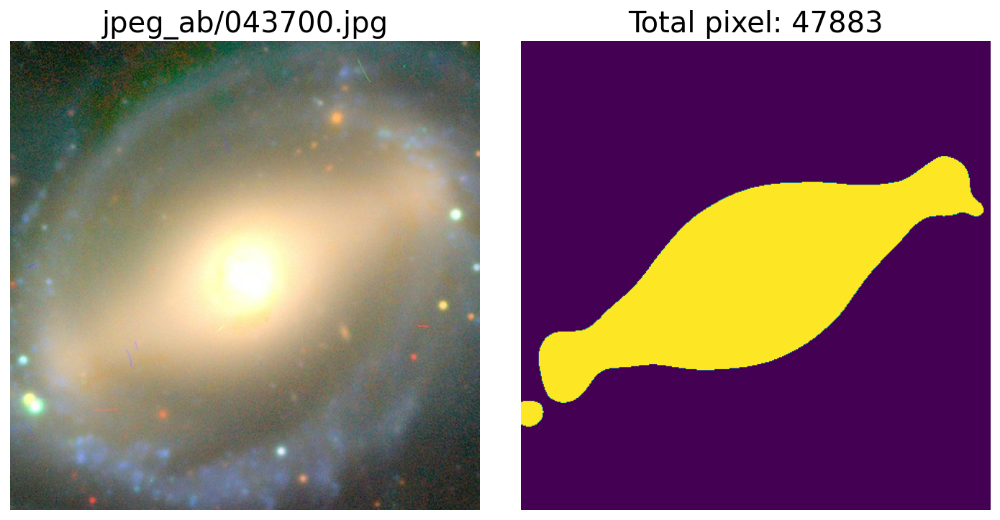

In [10]:
path = "jpeg_ab/043700.jpg"

img = tf.image.decode_jpeg(tf.io.read_file(path))

T = otsu(tf.expand_dims(img, axis=0))

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].set_title(path, fontsize=20)
ax[0].imshow(img)
ax[0].axis("off")

ax[1].set_title(f"Total pixel: {np.sum(T)}", fontsize=20)
ax[1].imshow(T[0])
ax[1].axis("off")
fig.tight_layout()

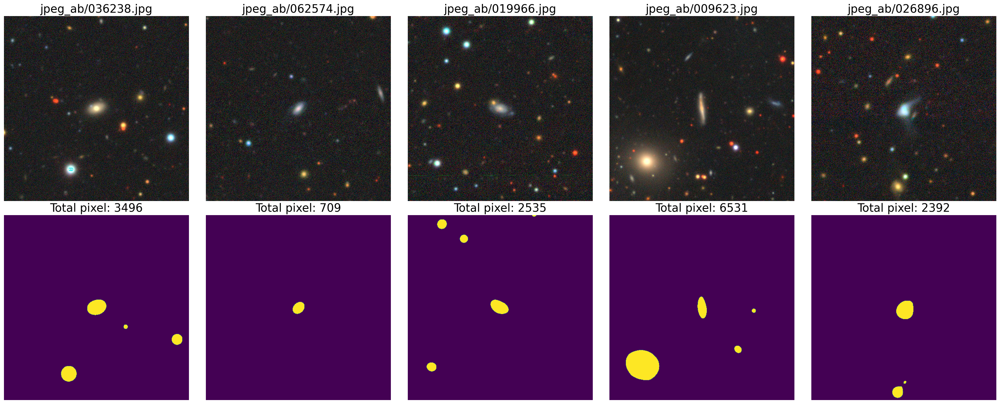

In [6]:
rand_idx = np.random.randint(0, 90000, 5)

paths = [f"jpeg_ab/{str(i).rjust(6, '0')}.jpg" for i in rand_idx]

imgs = np.stack([plt.imread(p) for p in paths])
T = otsu(imgs)

fig, ax = plt.subplots(2, 5, figsize=(25, 10))

for i in range(5):
    ax[0][i].set_title(paths[i], fontsize=20)
    ax[0][i].imshow(imgs[i])
    ax[0][i].axis("off")

    ax[1][i].set_title(f"Total pixel: {np.sum(T[i])}", fontsize=20)
    ax[1][i].imshow(T[i])
    ax[1][i].axis("off")
fig.tight_layout()

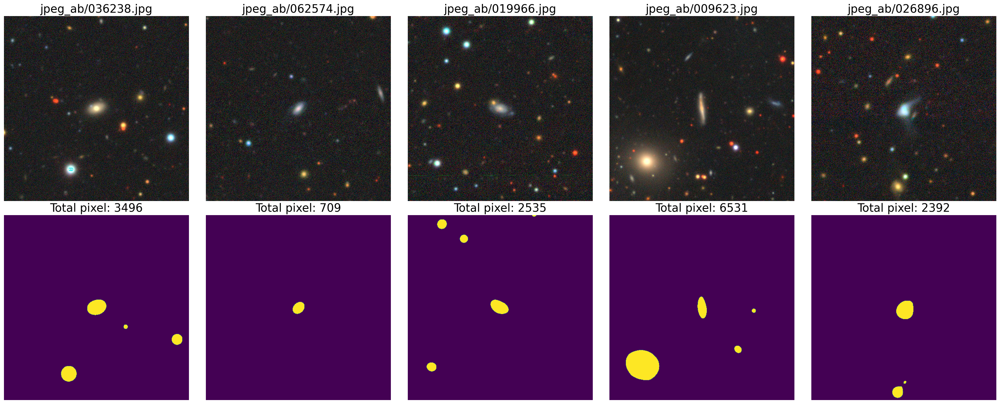

In [9]:
paths = [f"jpeg_ab/{str(i).rjust(6, '0')}.jpg" for i in rand_idx]

imgs = np.stack([plt.imread(p) for p in paths])
T = otsu(imgs)

fig, ax = plt.subplots(2, 5, figsize=(25, 10))

for i in range(5):
    ax[0][i].set_title(paths[i], fontsize=20)
    # 192:320
    # 128:384
    ax[0][i].imshow(imgs[i])
    ax[0][i].axis("off")

    ax[1][i].set_title(f"Total pixel: {np.sum(T[i])}", fontsize=20)
    ax[1][i].imshow(T[i])
    ax[1][i].axis("off")
fig.tight_layout()

## Apply galaxy size estimation to the whole dataset with Tensorflow

In [2]:
import tqdm
import numpy as np
import tensorflow as tf


class TFImgGenerator:
    """
    Using Tensorflow to quickly loop throught all galaxy images with all CPU/GPU resources
    """

    def __init__(self, folder="jpeg_ab", batch=64):
        self.folder = folder
        self.file_list = tf.io.match_filenames_once(f"./{folder}/*.jpg")
        self.num_file = self.file_list.shape[0]
        self.idx = 0
        self.batch = batch

        self.dataset = tf.data.Dataset.from_tensor_slices((self.file_list))
        self.dataset = (
            self.dataset.map(self.read_img_otsu, num_parallel_calls=tf.data.AUTOTUNE)
            .batch(self.batch)
            .prefetch(tf.data.AUTOTUNE)
        )

    def read_img_otsu(self, filename):
        image_string = tf.io.read_file(filename)
        image_decoded = tf.io.decode_image(image_string)
        return image_decoded

In [4]:
ds_ab = TFImgGenerator(folder="jpeg_ab", batch=128)

result_ab = np.zeros(ds_ab.num_file)
current_idx = 0

for i in tqdm.tqdm(ds_ab.dataset):
    T = otsu(i)
    tempresult = tf.math.count_nonzero(T, axis=(1, 2))
    current_shape = tempresult.shape[0]
    result_ab[current_idx : current_idx + current_shape] = tempresult
    current_idx += current_shape
np.savetxt("gsize_result_ab.csv", result_ab)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 727/727 [22:59<00:00,  1.90s/it]


In [ ]:
ds_ab = TFImgGenerator(folder="jpeg_c", batch=128)

result_c = np.zeros(ds_ab.num_file)
current_idx = 0

for i in tqdm.tqdm(ds_ab.dataset):
    T = otsu(i)
    tempresult = tf.math.count_nonzero(T, axis=(1, 2))
    current_shape = tempresult.shape[0]
    result_c[current_idx : current_idx + current_shape] = tempresult
    current_idx += current_shape
np.savetxt("gsize_result_c.csv", result_c)

In [3]:
ds_ab = TFImgGenerator(folder="gz2_des", batch=128)

result_gz2 = np.zeros(ds_ab.num_file)
current_idx = 0

for i in tqdm.tqdm(ds_ab.dataset):
    T = otsu(i)
    tempresult = tf.math.count_nonzero(T, axis=(1, 2))
    current_shape = tempresult.shape[0]
    result_gz2[current_idx : current_idx + current_shape] = tempresult
    current_idx += current_shape
np.savetxt("gsize_result_gz2.csv", result_gz2)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1867/1867 [1:02:33<00:00,  2.01s/it]


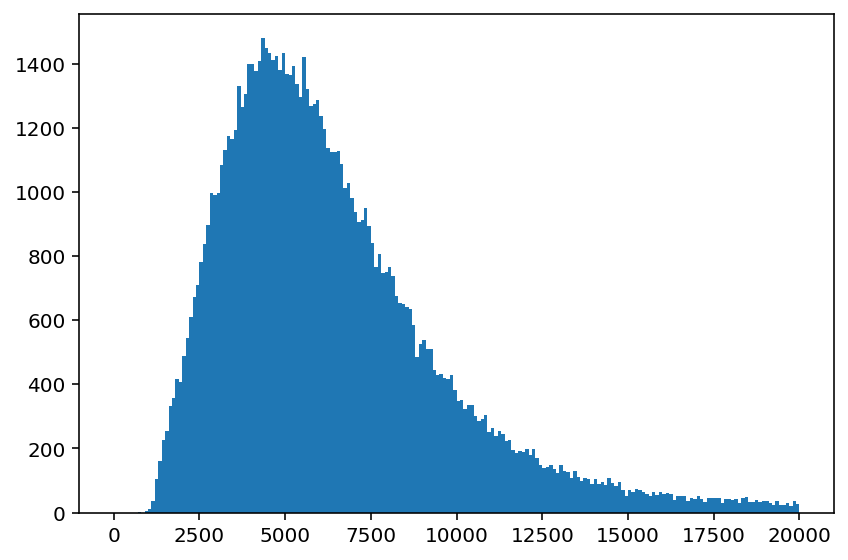

In [5]:
import numpy as np
import matplotlib.pyplot as plt

ab_gsize = np.genfromtxt("gsize_result_ab.csv")

plt.figure()
plt.hist(ab_gsize, range=(0, 20000), bins=200)
plt.tight_layout()

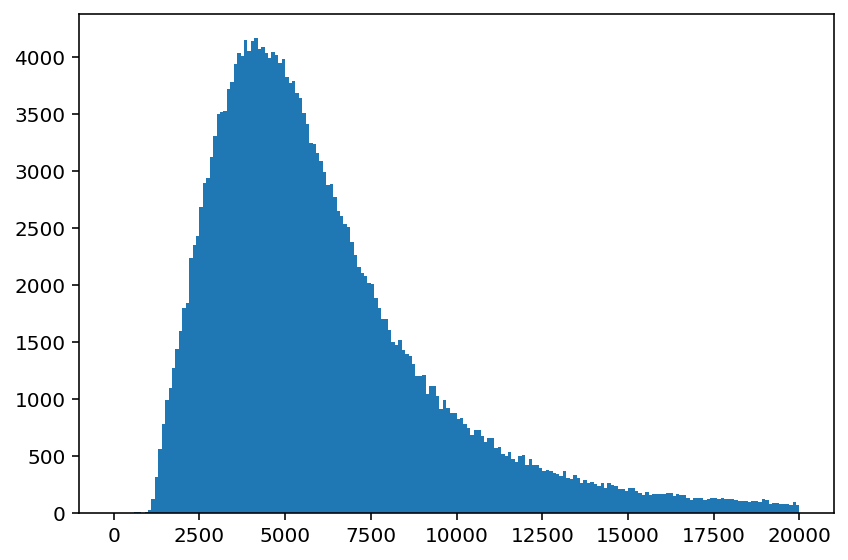

In [6]:
import numpy as np

ab_gsize = np.genfromtxt("gsize_result_c.csv")
plt.figure()
plt.hist(ab_gsize, range=(0, 20000), bins=200)
plt.tight_layout()

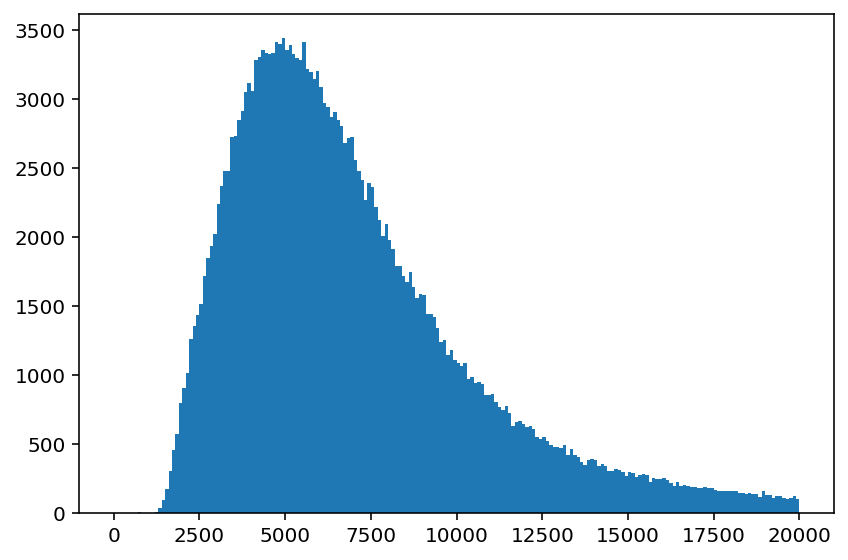

In [5]:
import numpy as np

gz2_gsize = np.genfromtxt("gsize_result_gz2.csv")
plt.figure()
plt.hist(gz2_gsize, range=(0, 20000), bins=200)
plt.tight_layout()